
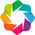

In [1]:
import holoviews as hv
import pandas as pd
hv.notebook_extension('bokeh')

In [2]:
import dask
import dask.dataframe as dd
import pandas as pd
from distributed import Client
client = Client(scheduler_file='/scratch/tmorton/dask/scheduler.json')

In [3]:
from explorer.dataset import QADataset
from explorer.functors import (Mag, MagDiff, CustomFunctor, DeconvolvedMoments, Column,
                            SdssTraceSize, PsfSdssTraceSizeDiff, HsmTraceSize, Seeing,
                            PsfHsmTraceSizeDiff, CompositeFunctor, StarGalaxyLabeller)

mag_diff = MagDiff('base_GaussianFlux', 'base_PsfFlux')
psf_mag = Mag('base_PsfFlux')
gauss_mag = Mag('base_GaussianFlux')
# seeing = CustomFunctor('0.168*2.35*sqrt(0.5*(ext_shapeHSM_HsmPsfMoments_xx**2 + ext_shapeHSM_HsmPsfMoments_yy**2))')
seeing = Seeing()
label = StarGalaxyLabeller()
# funcs = CompositeFunctor({'psf':psf_mag, 'gauss':gauss_mag, 'seeing':seeing, 'label':label})
funcs = {'magdiff':mag_diff, 'seeing':seeing}

In [4]:
# For getting real data
from explorer.catalog import ParquetCatalog, MultiMatchedCatalog
from explorer.utils import get_visits

def get_coadd(rerun, filt, tracts, unforced=False):
    table = 'unforced' if unforced else 'forced'
    files = ['{}/plots/{}/tract-{}/{}.parq'.format(rerun, filt, t, table) for t in tracts]
    return ParquetCatalog(files)
    
def get_visit(rerun, filt, tract, visit):
    file = '{}/plots/{}/tract-{}/visit-{}/catalog.parq'.format(rerun, filt, tract, visit)
#     name = float('{}.{}'.format(tract,visit))
    name = visit
    return ParquetCatalog([file], name=name)

def get_matched_catalog(rerun, filt, tracts, field, N=None):
    coadd_cat = get_coadd(rerun, filt, tracts)
    visits = {t:get_visits(field, t, filt) for t in tracts}
    visit_cats = [get_visit(rerun, filt, t, v) for t in tracts for v in visits[t]]
    if N is not None:
        visit_cats = visit_cats[:N]
    return MultiMatchedCatalog(coadd_cat, visit_cats, match_registry='match_registry.h5')

In [5]:
# rerun = '/scratch/tmorton/hscRerun/DM-12043/SSP_DEEP_XMM_LSS'
rerun = '/project/tmorton/DM-12043/SSP_WIDE_XMM'
field = 'WIDE'
tracts = [8766]#, 8767]
filts = ['HSC-G']#, 'HSC-R']#, 'HSC-I', 'HSC-Z', 'HSC-Y']
cats = {f:get_matched_catalog(rerun, f, tracts, field) for f in filts}

In [6]:
cat = cats['HSC-G']

In [7]:
cat.match()

In [8]:
from explorer.plots import multi_scattersky
from explorer.dataset import QADataset

In [9]:
# data = {f:QADataset(cats[f], funcs, flags=['calib_psfUsed', 'qaBad_flag'], client=client) for f in filts}

In [10]:
# %time data['HSC-G'].df.head()

In [11]:
# data['HSC-G'].ds

In [12]:
# data['HSC-G'].save('test_multimatch_8766_HSC-G.pkl')

distributed.client - WARNING - Client report stream closed to scheduler


In [13]:
# !du -hs test_multimatch_8766_HSC-G.pkl

In [14]:
data = {}
data['HSC-G'] = QADataset.load('test_multimatch_8766_HSC-G.pkl')

In [15]:
data['HSC-G'].df.head()

calib_psfUsed                                                \
                          coadd   9838   9840 9850 9852 9854 9856   9862 9868   
id                                                                              
38553275716337665         False    NaN  False  NaN  NaN  NaN  NaN    NaN  NaN   
38553275716337666         False    NaN  False  NaN  NaN  NaN  NaN  False  NaN   
38553275716337667         False  False  False  NaN  NaN  NaN  NaN  False  NaN   
38553275716337668         False    NaN    NaN  NaN  NaN  NaN  NaN    NaN  NaN   
38553275716337669         False    NaN    NaN  NaN  NaN  NaN  NaN  False  NaN   

                        ...  match_distance                                \
                  9870  ...           11638 42454 42456 42458 42460 42512   
id                      ...                                                 
38553275716337665  NaN  ...             NaN   NaN   NaN   NaN   NaN   NaN   
38553275716337666  NaN  ...             NaN   NaN   NaN   NaN   NaN   NaN   
38553275716337667  NaN  ...             NaN   NaN   NaN   NaN   NaN   NaN   
38553275716337668  NaN  ...             NaN   NaN   NaN   NaN   NaN   NaN   
38553275716337669  NaN  ...             NaN   NaN   NaN   NaN   NaN   NaN   

                                           
                  42514 42534 42536 coadd  
id                                         
38553275716337665   NaN   NaN   NaN   NaN  
38553275716337666   NaN   NaN   NaN   NaN  
38553275716337667   NaN   NaN   NaN   NaN  
38553275716337668   NaN   NaN   NaN   NaN  
38553275716337669   NaN   NaN   NaN   NaN  

[5 rows x 400 columns]

In [16]:
%%output max_frames=10000
%%opts Points [width=600, height=400, tools=['hover'], colorbar=True] (cmap='coolwarm', size=4)

from holoviews.operation import decimate
from explorer.plots import FilterStream
filter_stream = FilterStream()

dmap1 = data['HSC-G'].visit_explore('seeing', filter_stream=filter_stream)
dmap2 = data['HSC-G'].visit_explore('match_distance', filter_stream=filter_stream)

tap = hv.streams.Tap(source=dmap1, rename={'x':'ra', 'y':'dec'})

# (dmap1 + dmap2).cols(1)

In [17]:
dmap1

:DynamicMap   [visit,x_max,label]

In [18]:
import lsst.afw.display
lsst.afw.display.setDefaultBackend("ginga")
display = lsst.afw.display.Display(dims=(200, 200))
display.embed()

RuntimeError: Unable to set backend to ginga: "module 'ginga' has no attribute 'DisplayImpl'"

In [18]:
from explorer.match import match_lists
import numpy as np

from lsst.daf.persistence import Butler
import lsst.afw.coord as afwCoord
import lsst.afw.geom as afwGeom
import lsst.afw.image as afwImage

butler = Butler(rerun)

def find_closest(dmap, ra, dec):
    df = dmap.values()[0].data
    _, ind = match_lists(np.array([float(ra)]), np.array([float(dec)]), df.ra, df.dec, 1.)
    return df.iloc[ind]

def get_subexp(dmap, ra, dec, filt='HSC-G', tract=8766, width=100, height=100):
    visit = int(dmap.keys()[0][0])
    obj = find_closest(dmap, ra, dec)
    ccd = int(obj.ccdId.iloc[0])
    dataId = dict(visit=visit, filter=filt, ccd=ccd)
    exp = butler.get('calexp', dataId=dataId)
    
    ra, dec = obj.ra.iloc[0], obj.dec.iloc[0]
    pos = afwCoord.IcrsCoord(ra*afwGeom.degrees, dec*afwGeom.degrees) 
    wcs = exp.getWcs()
    pixel = afwGeom.Point2I(wcs.skyToPixel(pos))
    box = afwGeom.Box2I()  # empty
    box.include(pixel)  # one pixel
    box.grow(afwGeom.Extent2I(width, height))
    sub = exp[box, afwImage.PARENT]    
    return sub

def update_ginga(ra, dec, display=None, dmap=None, **kwargs):
    print(ra, dec)
    sub = get_subexp(dmap, ra, dec, **kwargs)
    display.mtv(sub)

from functools import partial
tap.add_subscriber(partial(update_ginga,display=display, dmap=dmap1))

In [11]:
find_closest(dmap1, tap.contents['ra'], tap.contents['dec'])

,id,calib_psfUsed,ccdId,dec,label,magdiff,qaBad_flag,ra,seeing,x,match_distance
69923,38553975796014918,False,86.0,-3.831994,star,0.002589,True,35.507762,2.703197,18.4324,0.062328


In [19]:
from explorer.plots import FlagSetter
import parambokeh

flag_setter = FlagSetter(filter_stream, flags=data['HSC-G'].flags, bad_flags=data['HSC-G'].flags)
parambokeh.Widgets(flag_setter, callback=flag_setter.event, push=False, on_init=True)

In [19]:
from explorer.plots import scattersky, multi_scattersky, FilterStream

multi_scattersky(data['HSC-G'].ds.groupby('label'), filter_stream=filter_stream)

:Layout
   .DynamicMap.I    :DynamicMap   [label]
   .DynamicMap.II   :DynamicMap   [label]
   .DynamicMap.III  :DynamicMap   [label]
   .DynamicMap.IV   :DynamicMap   [label]
   .DynamicMap.V    :DynamicMap   [label]
   .DynamicMap.VI   :DynamicMap   [label]
   .DynamicMap.VII  :DynamicMap   [label]
   .DynamicMap.VIII :DynamicMap   [label]
   .DynamicMap.IX   :DynamicMap   [label]
   .DynamicMap.X    :DynamicMap   [label]
   .DynamicMap.XI   :DynamicMap   [label]
   .DynamicMap.XII  :DynamicMap   [label]